<a href="https://colab.research.google.com/github/iey704/ComputerVision/blob/main/RandAugment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import os
import time

import torch
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor,Normalize, RandomHorizontalFlip, Resize
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader

import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F

from PIL import Image

from torch.utils.data import ConcatDataset

### GPU Setting ###
USE_CUDA = torch.cuda.is_available()
DEVICE = torch.device("cuda" if USE_CUDA else "cpu")
print(DEVICE)

cuda


In [3]:
### Custom Dataset ###
# Create DataLoader
class CUB2011(Dataset):
  def __init__(self, transform, mode='train'):
    self.mode = mode
    self.transform = transform

    if self.mode == 'train':
      self.image_folder = os.listdir('/content/gdrive/MyDrive/Colab Notebooks/CUB_200_2011_repackage_class50/datasets/train')
    elif self.mode == 'valid':
      self.image_folder = os.listdir('/content/gdrive/MyDrive/Colab Notebooks/CUB_200_2011_repackage_class50/datasets/valid')
    elif self.mode == 'test':
      self.image_folder = os.listdir('/content/gdrive/MyDrive/Colab Notebooks/CUB_200_2011_repackage_class50/datasets/test')

  def __len__(self):
    return len(self.image_folder)

  def __getitem__(self, idx):
    img_path = self.image_folder[idx]
    img = Image.open(os.path.join('/content/gdrive/MyDrive/Colab Notebooks/CUB_200_2011_repackage_class50/datasets', self.mode, img_path)).convert('RGB')
    img = self.transform(img)

    label = img_path.split('_')[-1].split('.')[0]
    label = int(label)
    return (img, label)

In [4]:
from torchvision.transforms import RandAugment

### Data Preprocessing & Data Augmentation ###
transforms_train_origin = transforms.Compose([transforms.Resize((448, 448)),transforms.ToTensor(),])
transforms_test = transforms.Compose([transforms.Resize((448,448)),transforms.ToTensor(),])
transforms_train_aug = transforms.Compose([
    transforms.Resize((448, 448)),
    RandAugment(2, 8),  # Apply RandAugment
    transforms.ToTensor(),
])

BATCH_SIZE = 32
train_set_origin = CUB2011(mode='train',
                    transform=transforms_train_origin)
val_set = CUB2011(mode='valid',
                  transform=transforms_test)
test_set = CUB2011(mode='test',
                  transform=transforms_test)

# 데이터 증강을 위해 원래 데이터를 복사하고 추가
train_set_augmented = CUB2011(mode='train', transform=transforms_train_aug)

# 두 데이터셋을 연결하여 새로운 훈련 데이터셋 생성
train_set_combined = ConcatDataset([train_set_origin, train_set_augmented])

print('Num of each dataset: ',len(train_set_combined),len(val_set),len(test_set))

# Dataloader class는 bath기반의 딥러닝모델 학습을 위해서 mini batch를 만들어주는 역할을 한다
# dataloader를 통해 dataset의 전체 데이터가 batch size로 나뉘게 된다
train_loader = DataLoader(train_set_combined,batch_size=BATCH_SIZE,shuffle=True)
val_loader = DataLoader(val_set,batch_size=BATCH_SIZE,shuffle=False)
test_loader = DataLoader(test_set,batch_size=BATCH_SIZE,shuffle=False)

print("Loaded dataloader")

Num of each dataset:  4720 296 298
Loaded dataloader


Batch 1
Image 1


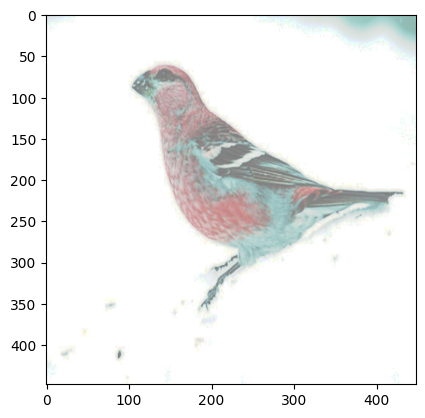

Image 2


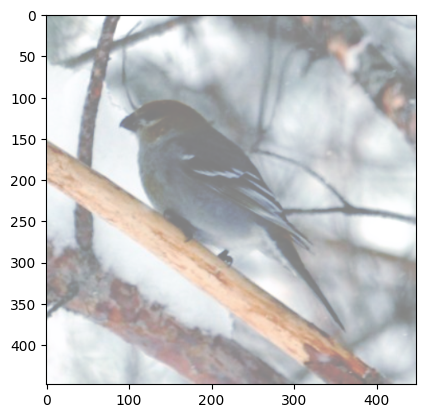

Image 3


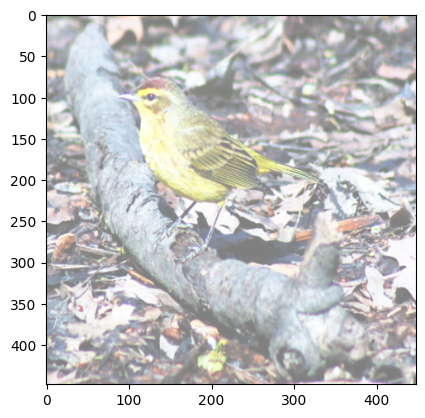

Image 4


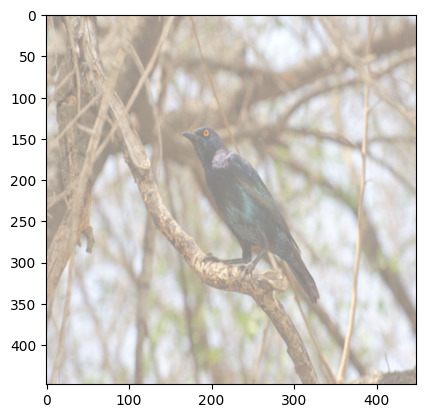

Image 5


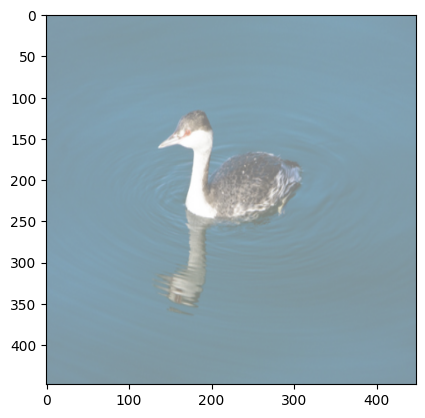

Image 6


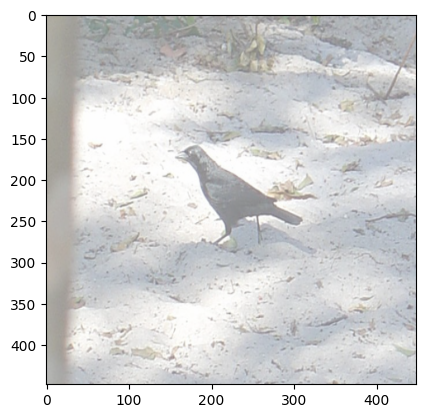

Image 7


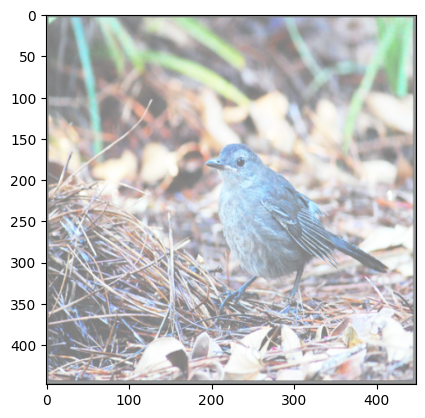

Image 8


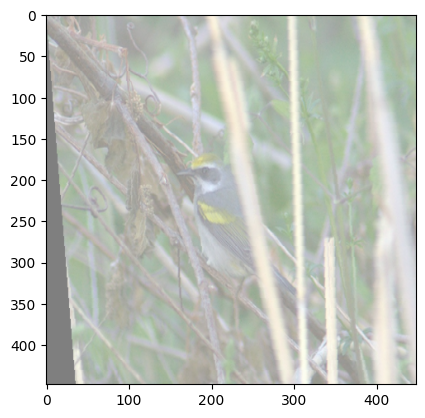

Image 9


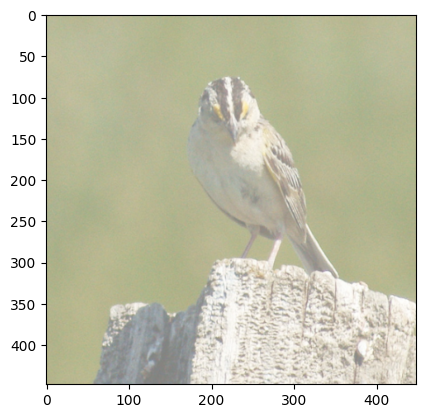

Image 10


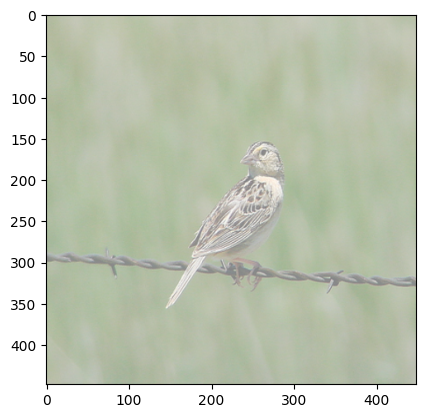

Image 11


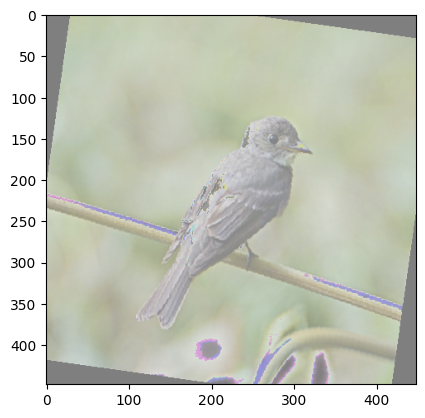

Image 12


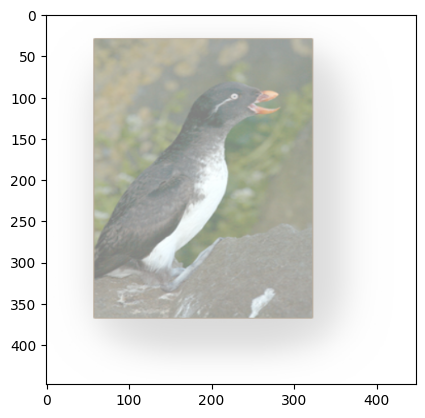

Image 13


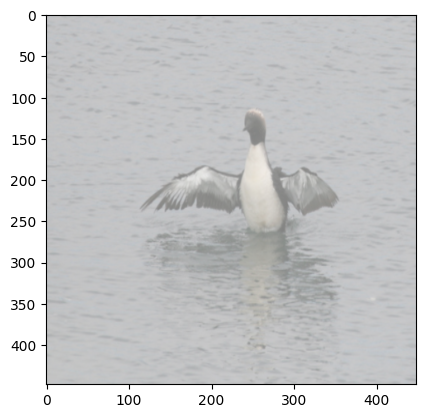

Image 14


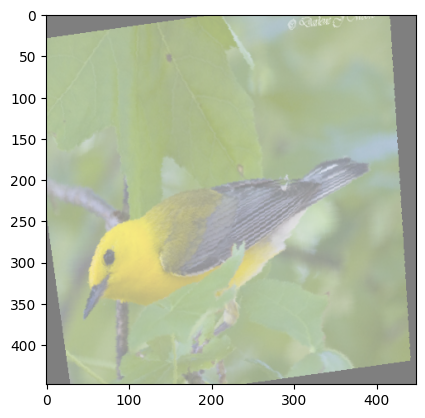

Image 15


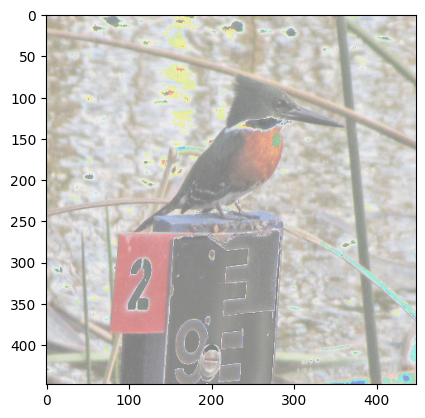

Image 16


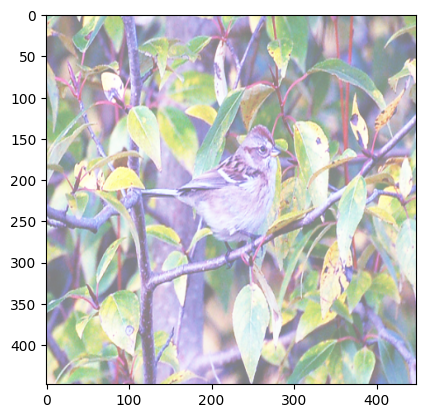

Image 17


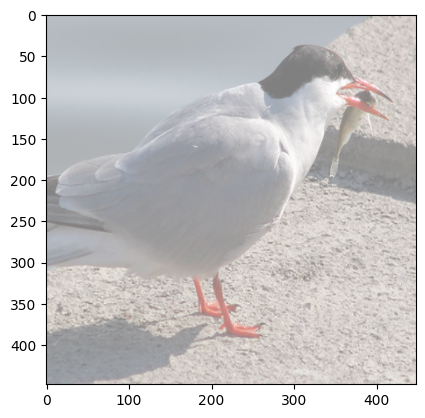

Image 18


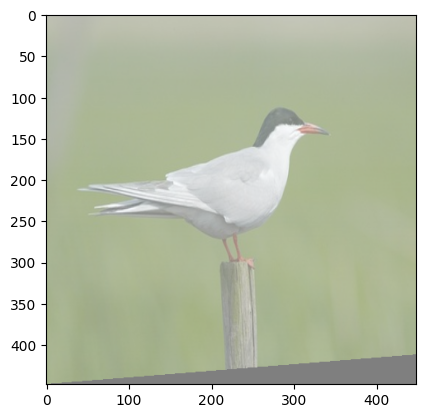

Image 19


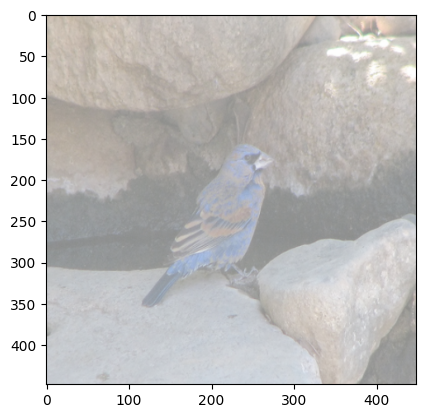

Image 20


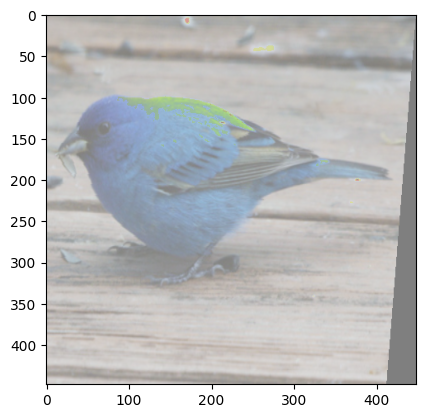

Image 21


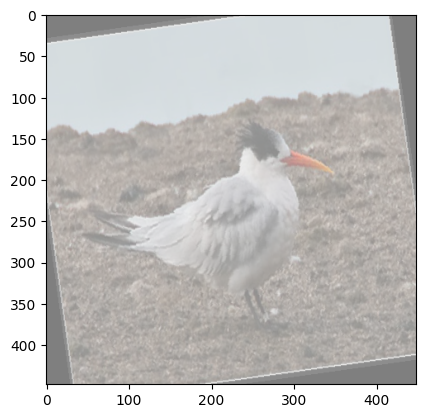

Image 22


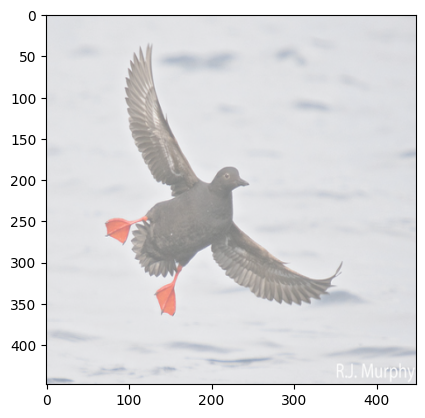

Image 23


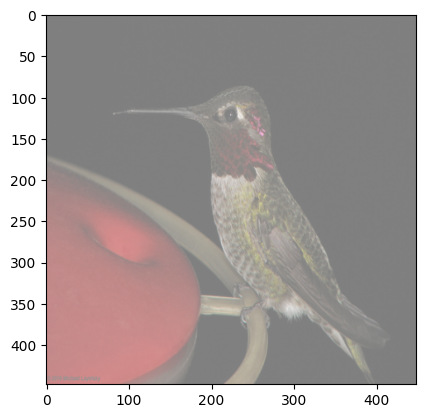

Image 24


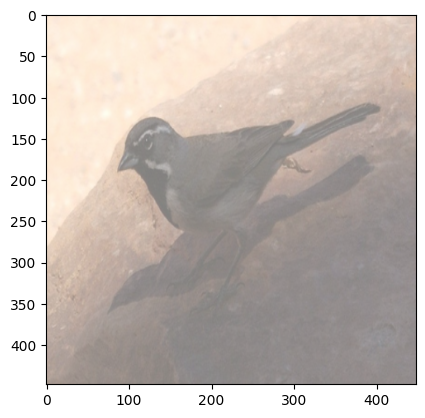

Image 25


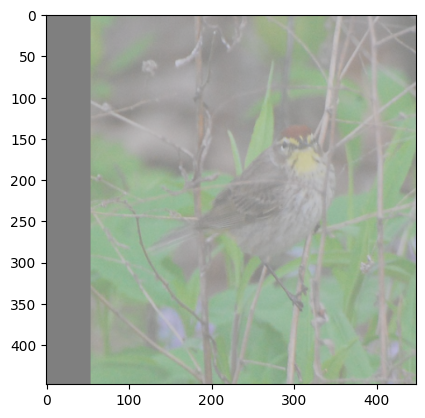

Image 26


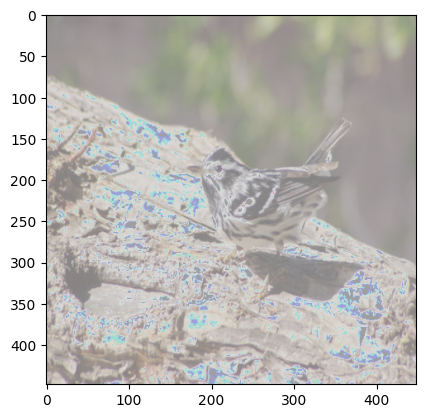

Image 27


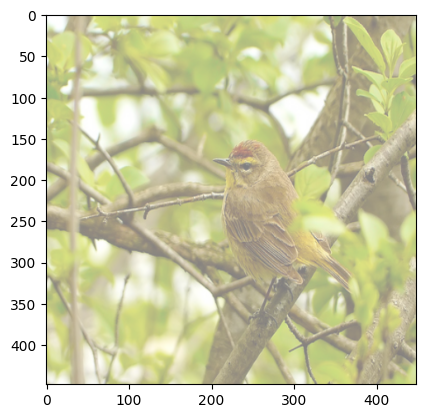

Image 28


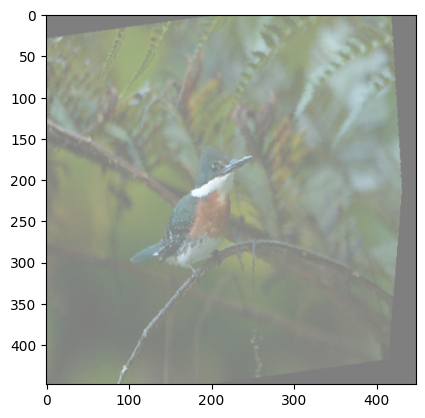

Image 29


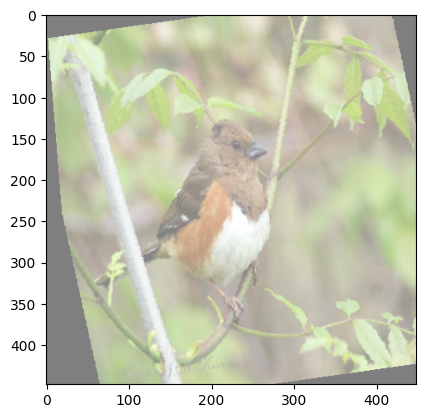

Image 30


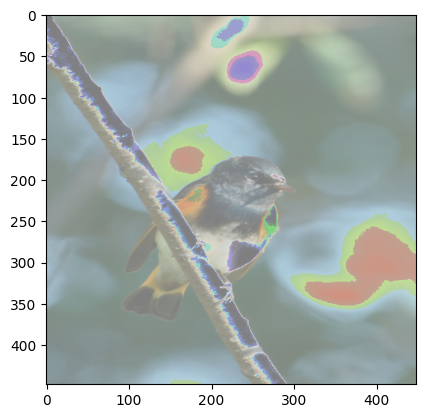

Image 31


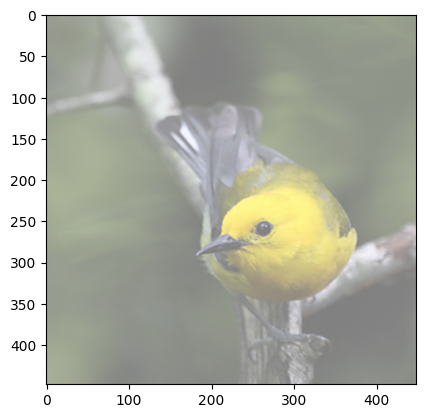

Image 32


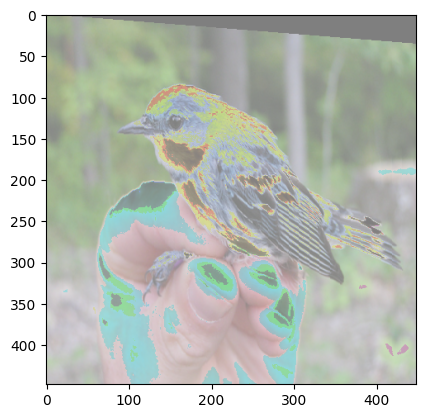

Batch 2
Image 1


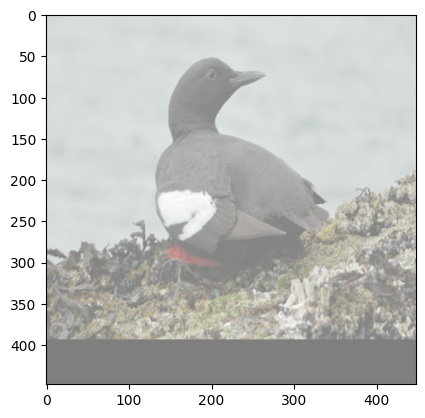

Image 2


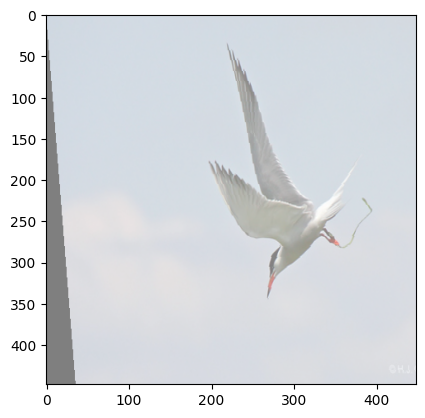

Image 3


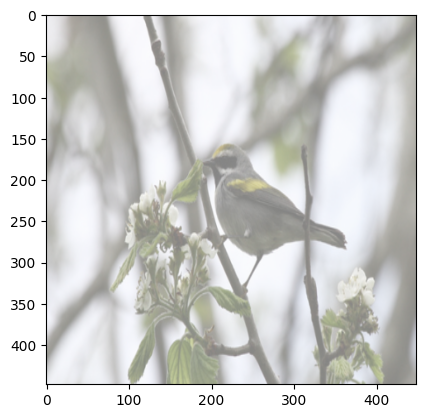

Image 4


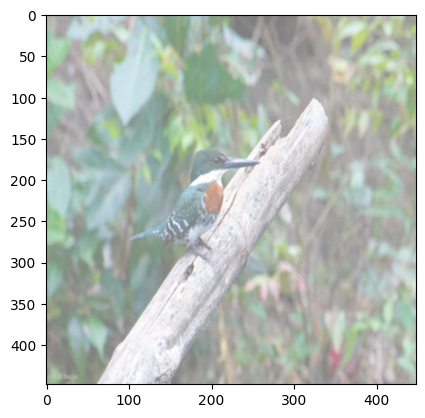

Image 5


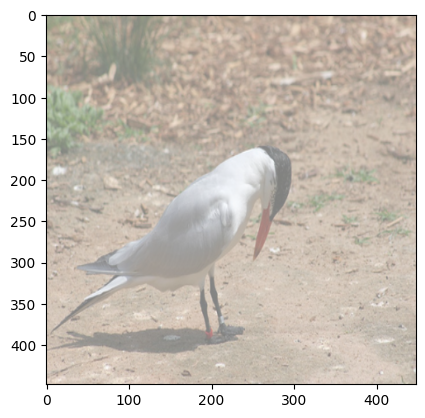

Image 6


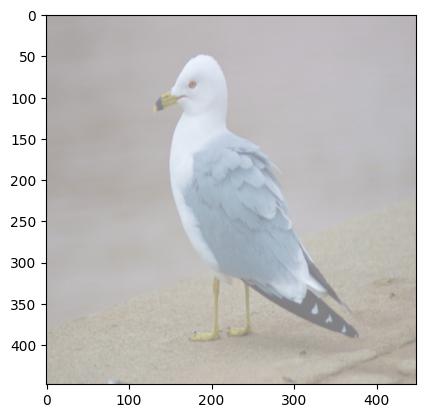

Image 7


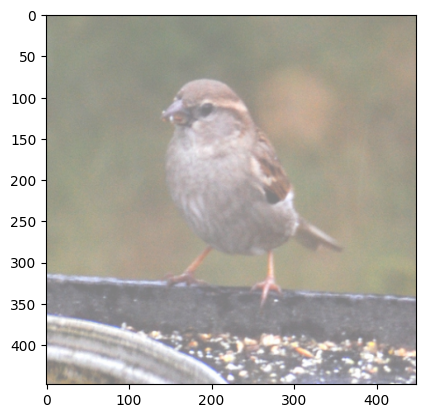

Image 8


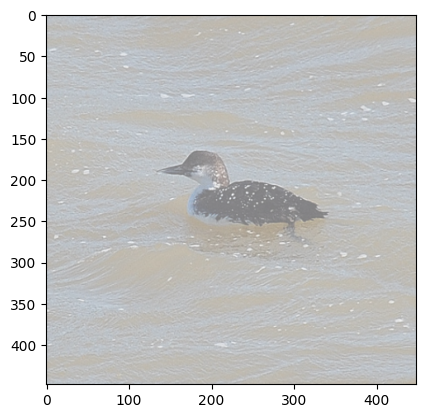

Image 9


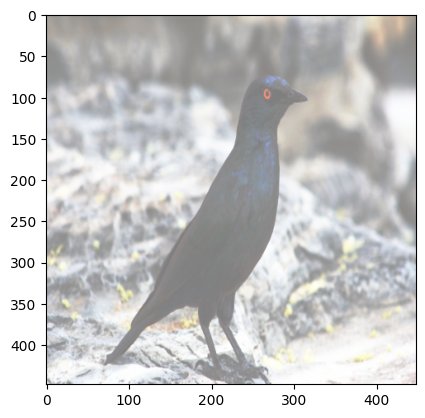

Image 10


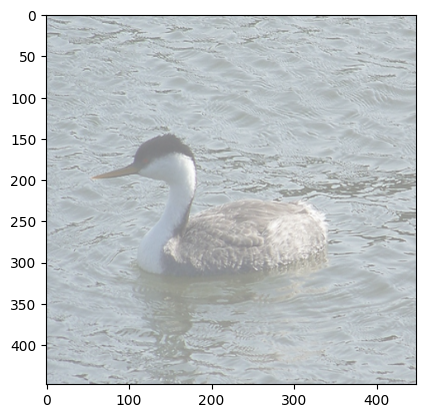

Image 11


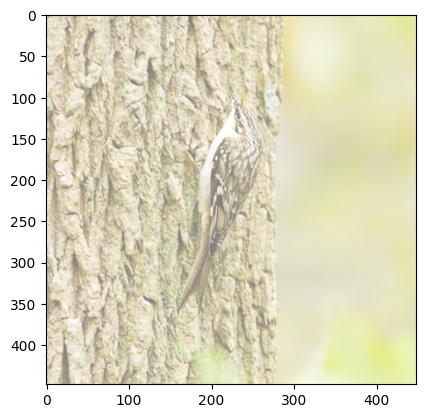

Image 12


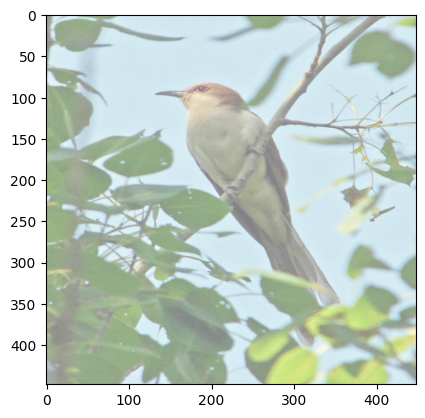

Image 13


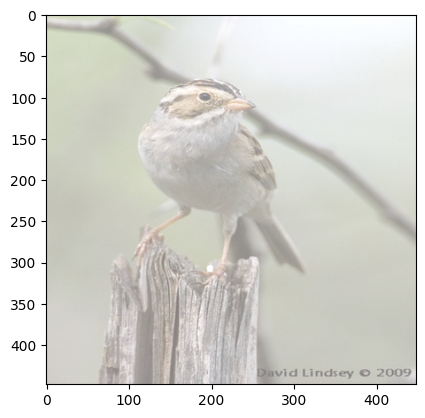

Image 14


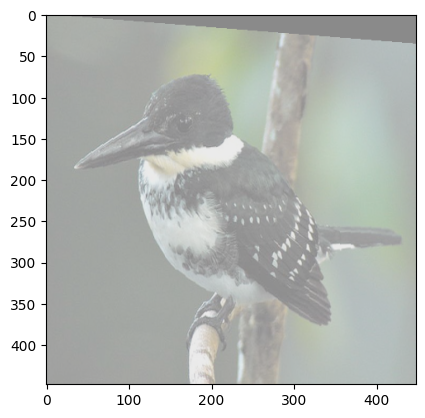

Image 15


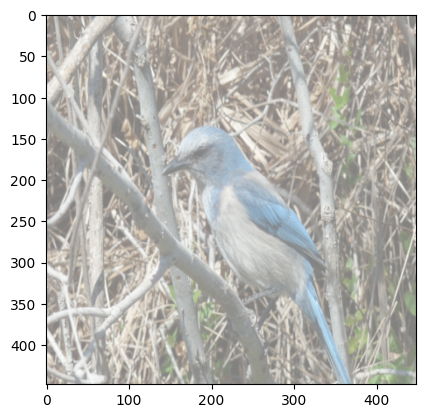

Image 16


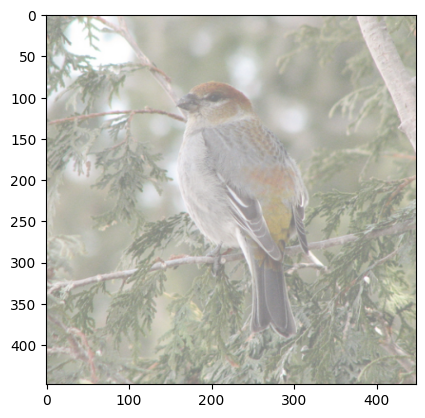

Image 17


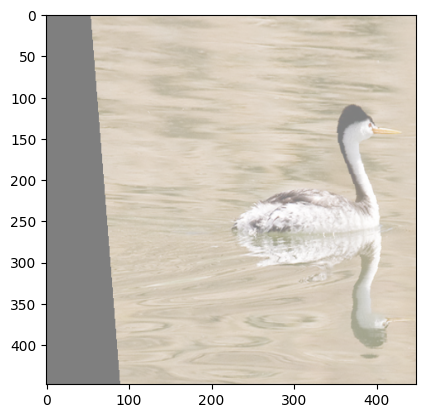

Image 18


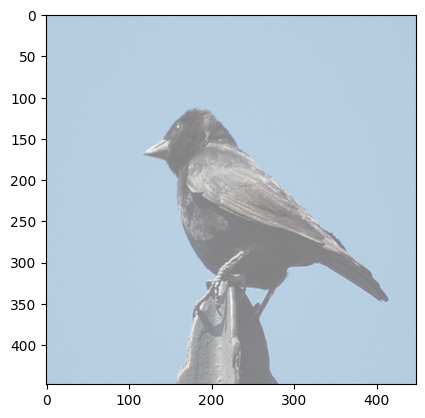

Image 19


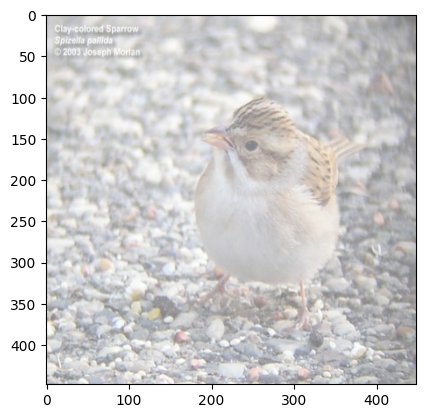

Image 20


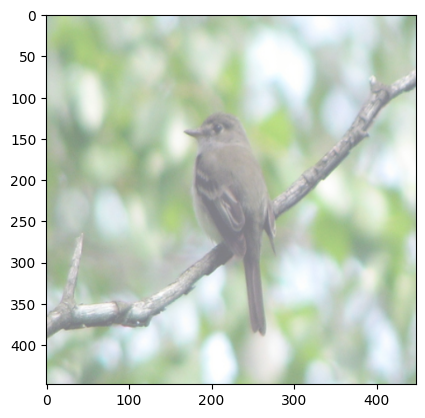

Image 21


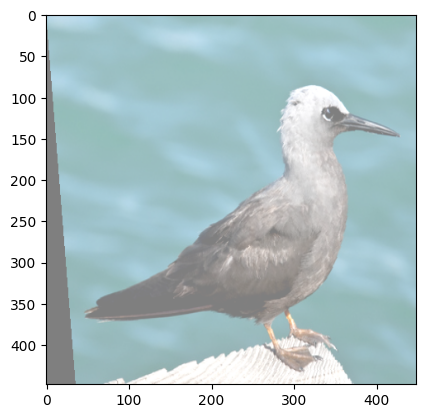

Image 22


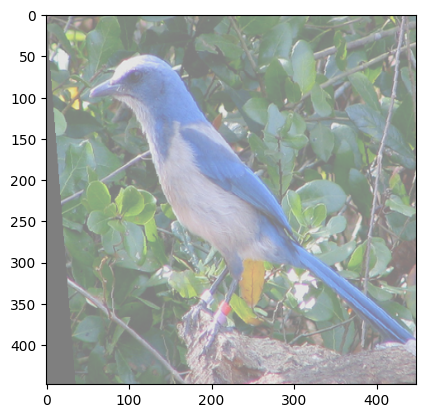

Image 23


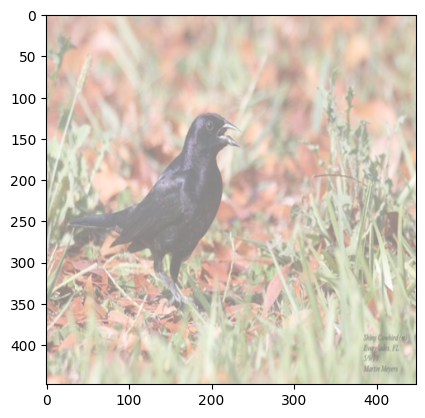

Image 24


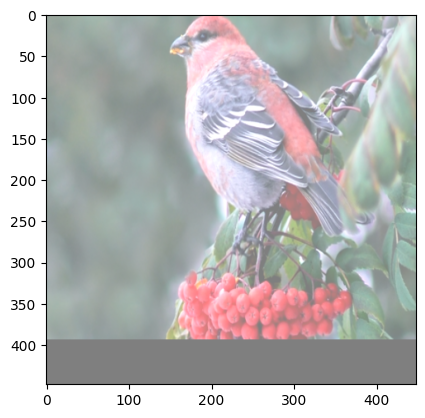

Image 25


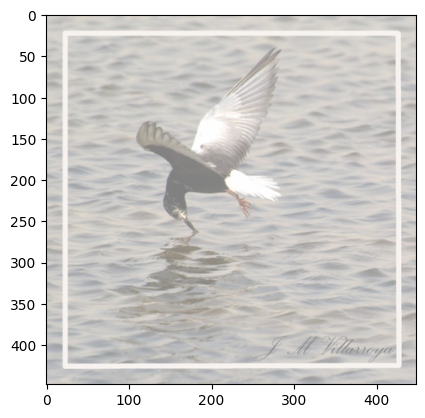

Image 26


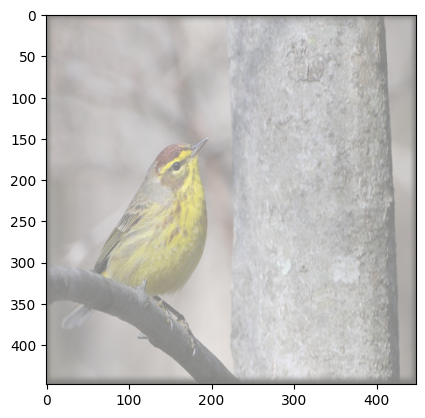

Image 27


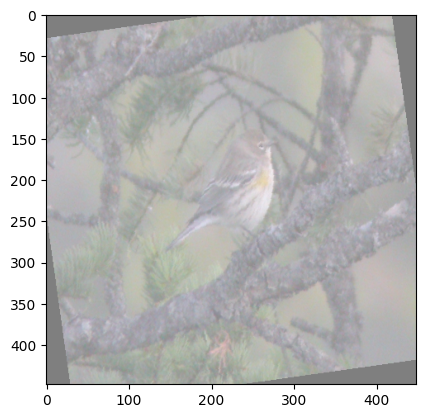

Image 28


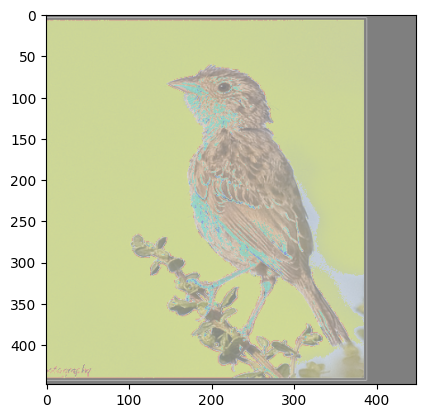

Image 29


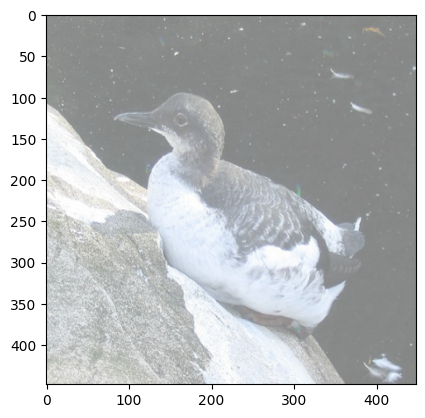

Image 30


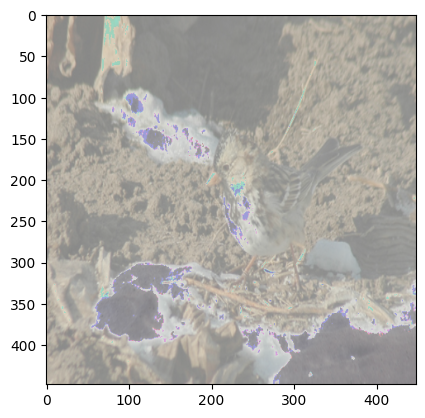

Image 31


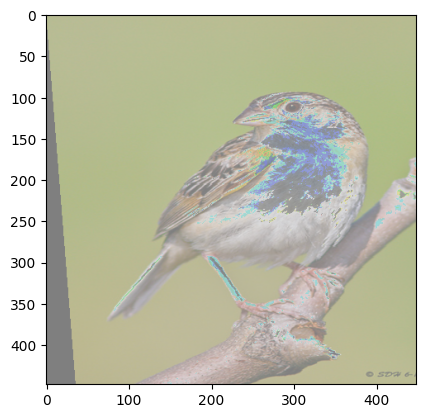

Image 32


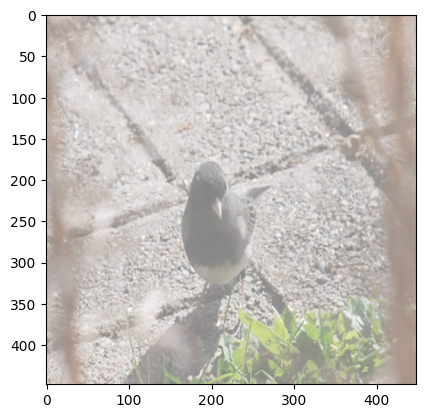

In [5]:
import matplotlib.pyplot as plt
import numpy as np

# Iterate through a few batches in the train_loader and visualize them
num_batches_to_visualize = 2  # You can change this to the number of batches you want to visualize

# Function to unnormalize and display an image
def imshow(img):
    img = img / 2 + 0.5  # Unnormalize the image (if it was previously normalized)
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Iterate through the train_loader
for batch_idx, (images, labels) in enumerate(train_loader):
    if batch_idx >= num_batches_to_visualize:
        break  # Stop after visualizing the specified number of batches

    print(f"Batch {batch_idx + 1}")
    # Visualize each image in the batch
    for i in range(len(images)):
        print(f"Image {i + 1}")
        imshow(images[i])  # Display the image


In [6]:
### Model / Optimizer ###
EPOCH = 30
lr = 0.1

model = models.resnet18(pretrained=True)

### Tranfer Learning ###
num_features = model.fc.in_features
model.fc = nn.Linear(num_features,50)
model.to(DEVICE)

optimizer = optim.SGD(model.parameters(),lr=lr)

print("Created a learning model and optimizer")

### Train/Evaluation ###
def train(model,train_loader,optimizer,epoch):
  # 모델을 학습 모드로 변환
  model.train()

  for i,(image,target) in enumerate(train_loader):
    # 각 image와 target을 앞서 설정한 DEVICE(GPU 혹은 CPU)에 보내기
    image,target = image.to(DEVICE),target.to(DEVICE)
    # data를 모델에 넣어서 hypothesis 획득
    output = model(image)
    # 반복 때마다 기울기를 새로 계산, 이 함수로 초기화
    optimizer.zero_grad()
    # 비교해서 loss 계산
    train_loss = F.cross_entropy(output,target).to(DEVICE)
    # loss를 backward 계산
    train_loss.backward()
    # 계산한 기울기를 앞서 정의한 알고리즘에 맞춰서 가중치를 수정
    optimizer.step()

    if i%10 ==0:
      print(
          f'Train Epoch: {epoch} [{i}/{len(train_loader)}]\tloss: {train_loss.item():6f}')

  return train_loss

def evaluate(model,val_loader):
  # 모델을 평가 모드로 변환
  model.eval()

  eval_loss = 0
  correct = 0
  with torch.no_grad():
    for i,(image,target) in enumerate(val_loader):
      image,target = image.to(DEVICE),target.to(DEVICE)
      output = model(image)

      eval_loss += F.cross_entropy(output,target, reduction='sum').item()
      pred = output.max(1,keepdim=True)[1]
      correct += pred.eq(target.view_as(pred)).sum().item()

  eval_loss /= len(val_loader.dataset)
  eval_accuracy = 100*correct / len(val_loader.dataset)
  return eval_loss,eval_accuracy

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 89.2MB/s]


Created a learning model and optimizer


In [7]:
### Main ###
start = time.time()
best = 0
train_losses = []  # 훈련 손실을 저장할 목록
val_losses = []    # 검증 손실을 저장할 목록

for epoch in range(EPOCH):
  train_loss = train(model,train_loader,optimizer,epoch)
  val_loss,val_accuracy = evaluate(model,val_loader)

  # 훈련 및 검증 손실을 목록에 추가
  train_losses.append(train_loss)
  val_losses.append(val_loss)

  # Save best model
  if val_accuracy > best:
    best = val_accuracy
    torch.save(model.state_dict(),"./best_model.pth")

  print(f"[{epoch}]Validation Loss: {val_loss:.4f},Accuracy: {val_accuracy:.4f}%")

# Test result
test_loss,test_accuracy = evaluate(model,test_loader)
print(f'[FINAL] Test Loss: {test_loss:.4f},Accuracy: {test_accuracy:.4f}%')

end = time.time()
elasped_time = end - start

print("Best Accuracy: ",best)
print(
    f"Elasped Time: {int(elasped_time/3600)}h, {int(elasped_time/60)}m, {int(elasped_time%60)}s")
print(
    f"time: {int(elasped_time/3600)}h, {int(elasped_time/60)}m, {int(elasped_time%60)}s")

Train Epoch: 0 [0/148]	loss: 3.985729
Train Epoch: 0 [10/148]	loss: 4.547434
Train Epoch: 0 [20/148]	loss: 2.846028
Train Epoch: 0 [30/148]	loss: 2.158011
Train Epoch: 0 [40/148]	loss: 2.053253
Train Epoch: 0 [50/148]	loss: 1.645763
Train Epoch: 0 [60/148]	loss: 1.647031
Train Epoch: 0 [70/148]	loss: 1.341040
Train Epoch: 0 [80/148]	loss: 1.131297
Train Epoch: 0 [90/148]	loss: 0.986736
Train Epoch: 0 [100/148]	loss: 0.956731
Train Epoch: 0 [110/148]	loss: 0.697380
Train Epoch: 0 [120/148]	loss: 0.652655
Train Epoch: 0 [130/148]	loss: 0.864770
Train Epoch: 0 [140/148]	loss: 0.800112
[0]Validation Loss: 0.8902,Accuracy: 76.6892%
Train Epoch: 1 [0/148]	loss: 0.627536
Train Epoch: 1 [10/148]	loss: 0.555161
Train Epoch: 1 [20/148]	loss: 0.287547
Train Epoch: 1 [30/148]	loss: 0.478238
Train Epoch: 1 [40/148]	loss: 0.424970
Train Epoch: 1 [50/148]	loss: 0.397337
Train Epoch: 1 [60/148]	loss: 0.457936
Train Epoch: 1 [70/148]	loss: 0.370281
Train Epoch: 1 [80/148]	loss: 0.372856
Train Epoch: 1 

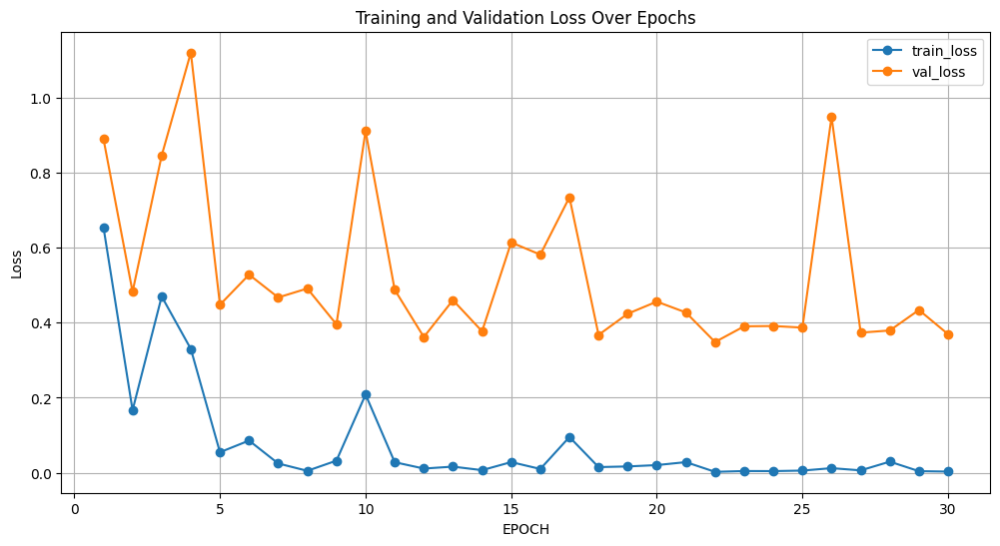

In [8]:
# 이제 손실 값을 플로팅합니다.
import matplotlib.pyplot as plt

# train_loss와 val_loss 텐서를 CPU로 이동하고 NumPy 배열로 변환
train_losses = [loss.cpu().detach().numpy() if isinstance(loss, torch.Tensor) else loss for loss in train_losses]
val_losses = [loss.cpu().detach().numpy() if isinstance(loss, torch.Tensor) else loss for loss in val_losses]

plt.figure(figsize=(12, 6))
plt.plot(range(1, EPOCH + 1), train_losses, label='train_loss', marker='o')
plt.plot(range(1, EPOCH + 1), val_losses, label='val_loss', marker='o')
plt.title('Training and Validation Loss Over Epochs')

plt.xlabel('EPOCH')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

---------------------------------------------------------------------------
OutOfMemoryError                          Traceback (most recent call last)
Cell In[7], line 8
      5 val_losses = []    # 검증 손실을 저장할 목록
      7 for epoch in range(EPOCH):
----> 8   train_loss = train(model,train_loader,optimizer,epoch)
      9   val_loss,val_accuracy = evaluate(model,val_loader)
     11   # 훈련 및 검증 손실을 목록에 추가

Cell In[5], line 23, in train(model, train_loader, optimizer, epoch)
     19 model.train()
     21 for i,(image,target) in enumerate(train_loader):
     22   # 각 image와 target을 앞서 설정한 DEVICE(GPU 혹은 CPU)에 보내기
---> 23   image,target = image.to(DEVICE),target.to(DEVICE)
     24   # data를 모델에 넣어서 hypothesis 획득
     25   output = model(image)

OutOfMemoryError: CUDA out of memory. Tried to allocate 74.00 MiB (GPU 0; 9.78 GiB total capacity; 1.45 GiB already allocated; 68.00 MiB free; 1.48 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF


In [9]:
!git clone https://github.com/iey704/ComputerVision.git

Cloning into 'ComputerVision'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 17 (delta 5), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (17/17), 14.55 MiB | 8.40 MiB/s, done.
Resolving deltas: 100% (5/5), done.
